In [1]:
# Importing the Libraries

import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

plt.style.use("fivethirtyeight")

In [2]:
# Loading the dataset 
shipping_data = pd.read_csv("E-Commerce Shipping Data.csv")
shipping_data.head(5)

,ID,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Gender,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
0,1,D,Flight,4,2,177,3,low,F,44,1233,1
1,2,F,Flight,4,5,216,2,low,M,59,3088,1
2,3,A,Flight,2,2,183,4,low,M,48,3374,1
3,4,B,Flight,3,3,176,4,medium,M,10,1177,1
4,5,C,Flight,2,2,184,3,medium,F,46,2484,1


In [3]:
# Shipping dataset information

shipping_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10999 entries, 0 to 10998
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   ID                   10999 non-null  int64 
 1   Warehouse_block      10999 non-null  object
 2   Mode_of_Shipment     10999 non-null  object
 3   Customer_care_calls  10999 non-null  int64 
 4   Customer_rating      10999 non-null  int64 
 5   Cost_of_the_Product  10999 non-null  int64 
 6   Prior_purchases      10999 non-null  int64 
 7   Product_importance   10999 non-null  object
 8   Gender               10999 non-null  object
 9   Discount_offered     10999 non-null  int64 
 10  Weight_in_gms        10999 non-null  int64 
 11  Reached.on.Time_Y.N  10999 non-null  int64 
dtypes: int64(8), object(4)
memory usage: 1.0+ MB


In [4]:
shipping_data.describe()

,ID,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
count,10999.00000,10999.000000,10999.000000,10999.000000,10999.000000,10999.000000,10999.000000,10999.000000
mean,5500.00000,4.054459,2.990545,210.196836,3.567597,13.373216,3634.016729,0.596691
std,3175.28214,1.141490,1.413603,48.063272,1.522860,16.205527,1635.377251,0.490584
min,1.00000,2.000000,1.000000,96.000000,2.000000,1.000000,1001.000000,0.000000
25%,2750.50000,3.000000,2.000000,169.000000,3.000000,4.000000,1839.500000,0.000000
50%,5500.00000,4.000000,3.000000,214.000000,3.000000,7.000000,4149.000000,1.000000
75%,8249.50000,5.000000,4.000000,251.000000,4.000000,10.000000,5050.000000,1.000000
max,10999.00000,7.000000,5.000000,310.000000,10.000000,65.000000,7846.000000,1.000000


In [5]:
shipping_data.describe(include=["object"])

,Warehouse_block,Mode_of_Shipment,Product_importance,Gender
count,10999,10999,10999,10999
unique,5,3,3,2
top,F,Ship,low,F
freq,3666,7462,5297,5545


In [6]:
# Check the dataset if there is any null values

shipping_data.isnull().sum()

ID                     0
Warehouse_block        0
Mode_of_Shipment       0
Customer_care_calls    0
Customer_rating        0
Cost_of_the_Product    0
Prior_purchases        0
Product_importance     0
Gender                 0
Discount_offered       0
Weight_in_gms          0
Reached.on.Time_Y.N    0
dtype: int64

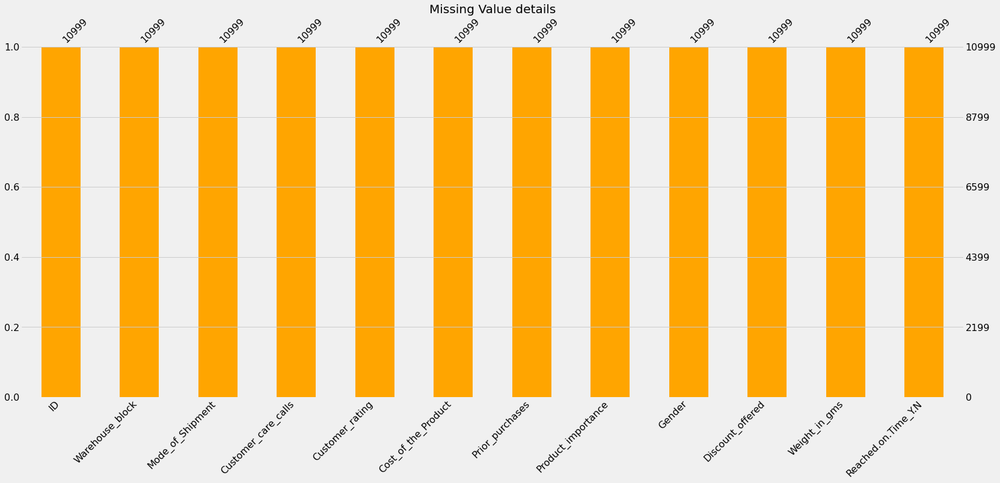

In [7]:
# Visualization  for Missing Value

plt.figure(figsize=(2,5))
import missingno as msno
msno.bar(shipping_data, color = "orange")
plt.title("Missing Value details")
plt.show()

In [8]:
# Drop the unwanted column

shipping_data.drop("ID", axis = 1, inplace = True)
shipping_data.head(5)

,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Gender,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
0,D,Flight,4,2,177,3,low,F,44,1233,1
1,F,Flight,4,5,216,2,low,M,59,3088,1
2,A,Flight,2,2,183,4,low,M,48,3374,1
3,B,Flight,3,3,176,4,medium,M,10,1177,1
4,C,Flight,2,2,184,3,medium,F,46,2484,1


In [9]:
object_columns = shipping_data.select_dtypes(include = ["object"])
object_columns.head(5)

,Warehouse_block,Mode_of_Shipment,Product_importance,Gender
0,D,Flight,low,F
1,F,Flight,low,M
2,A,Flight,low,M
3,B,Flight,medium,M
4,C,Flight,medium,F


## Correlation Matrix

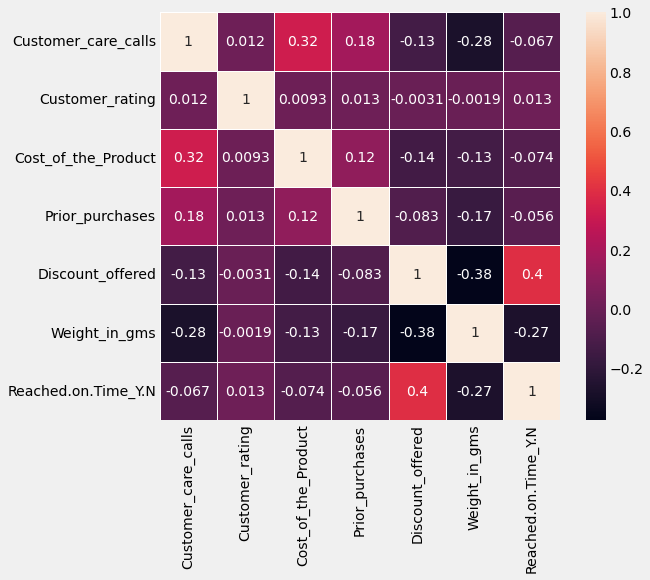

In [10]:
plt.figure(figsize=(8,7))
data=shipping_data.corr()
sns.heatmap(data, annot = True, linewidth = 1.00)
plt.show()

##### Positive Correlation
From the Above HeatMap, some of the correlation:-

Customer_care_calls have a positive correlation with cost_of_the_product, prior_purchases and customer_rating            
cost_of_the_product have a positive correlation of 32% with customer_care_calls               
Discount_offered have a positive correlation of 40% with Reached.on.Time_Y.N

##### Negative Correlation
Customer_care_calls have a negative correlation of 28% with Weight_in_gms           
Discount_offered have a negative correlation of 38% with Weight_in_gms            
Reached.om.Time_Y.N have a negative correlation of 27% with Weight_in_gms

In [11]:
fig = px.parallel_categories(shipping_data, color = "Customer_rating",color_continuous_scale=["red", "blue"])
fig.show()

# Exploratory Data Analysis (EDA)

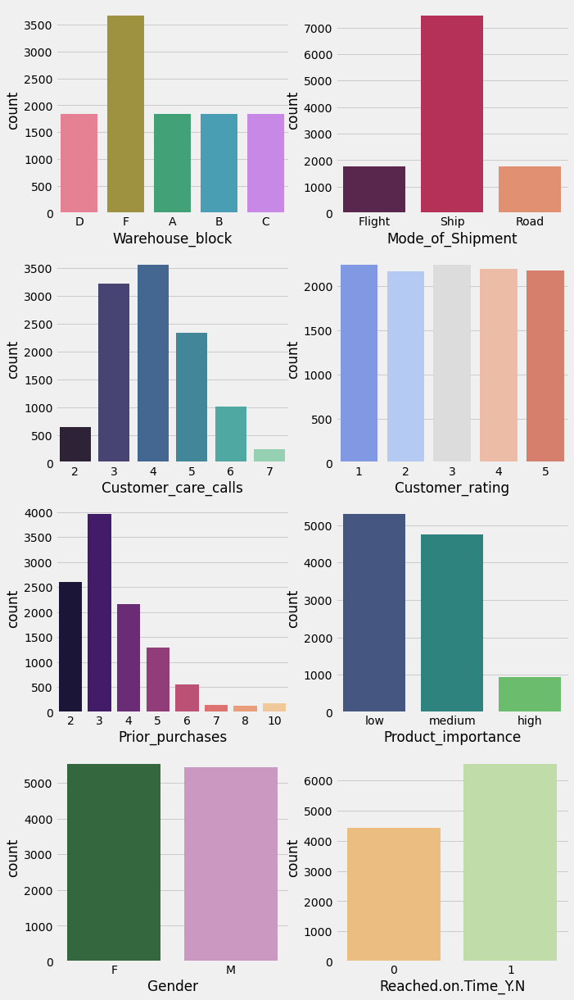

In [12]:
fig, ax = plt.subplots(4,2, figsize = (10,20))
sns.countplot("Warehouse_block", data = shipping_data, ax=ax[0][0], palette="husl")
sns.countplot("Mode_of_Shipment", data = shipping_data, ax=ax[0][1], palette="rocket")
sns.countplot("Customer_care_calls", data = shipping_data, ax=ax[1][0], palette="mako")
sns.countplot("Customer_rating", data = shipping_data, ax=ax[1][1], palette="coolwarm")
sns.countplot("Prior_purchases", data = shipping_data, ax=ax[2][0], palette="magma")
sns.countplot("Product_importance", data = shipping_data, ax=ax[2][1], palette="viridis")
sns.countplot("Gender", data = shipping_data, ax=ax[3][0], palette="cubehelix")
sns.countplot("Reached.on.Time_Y.N", data = shipping_data, ax=ax[3][1], palette="Spectral")
plt.show()

### Warehouse_block

In [13]:
# Categorise with Percentage for Warehouse_block

warehouse = object_columns["Warehouse_block"].value_counts().reset_index()
warehouse.columns = ["warehouse", 'value_counts']
colors=sns.color_palette("dark:salmon_r", as_cmap=True)
fig = px.pie(warehouse,names = 'warehouse', values = 'value_counts', width = 500, height = 400, hole = 0.5,color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_traces(textinfo = 'percent+label')

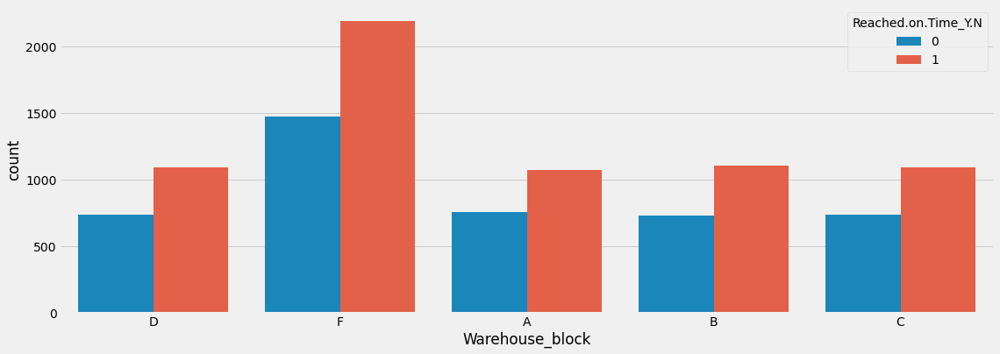

In [14]:
# To see the impact of Reached on Time or not with Warehouse column
plt.figure(figsize = (17, 6))
sns.countplot("Warehouse_block", hue="Reached.on.Time_Y.N", data = shipping_data)
plt.show()

In [15]:
# # Warehouse that contains most weights
total_weight_in_gms = shipping_data.groupby(["Warehouse_block"])["Weight_in_gms"].sum().reset_index()


In [16]:
# Visualization - Warehouse that contains most weight

fig = px.histogram(total_weight_in_gms, x = "Warehouse_block", y = "Weight_in_gms",title = "Weight per Warehouse", width = 900, height = 500,
                   color_discrete_sequence=px.colors.sequential.Reds_r)
fig.show()

In [17]:
# Effect of Warehouse on cost of products

warehouse_cost_product = shipping_data.groupby(["Warehouse_block"])["Cost_of_the_Product"].sum().reset_index()
warehouse_cost_product

,Warehouse_block,Cost_of_the_Product
0,A,382671
1,B,388888
2,C,387114
3,D,386805
4,F,766477


In [18]:
# Effect of Warehouse on Cost of Products

fig = px.histogram(data_frame = shipping_data, x = "Cost_of_the_Product", color="Warehouse_block", nbins = 10, marginal = "box",
                  color_discrete_sequence=px.colors.sequential.Reds_r)
fig.show()

### Gender

In [19]:
# Categories with Percentage for Gender column

gender = object_columns["Gender"].value_counts().reset_index()
gender.columns = ["Gender", 'value_counts']
colors=sns.color_palette("dark:salmon_r", as_cmap=True)
fig = px.pie(gender,names = 'Gender', values = 'value_counts', width = 500, height = 400, hole = 0.5,color_discrete_sequence=px.colors.sequential.Blues_r)
fig.update_traces(textinfo = 'percent+label')


In [20]:
# To see the impact of Reached on Time or not with Gender


fig = px.histogram(shipping_data, x = "Reached.on.Time_Y.N", y = "Warehouse_block", color = "Gender", 
                   marginal = "box", hover_data = shipping_data.columns,color_discrete_sequence=px.colors.sequential.Cividis)
fig.show()

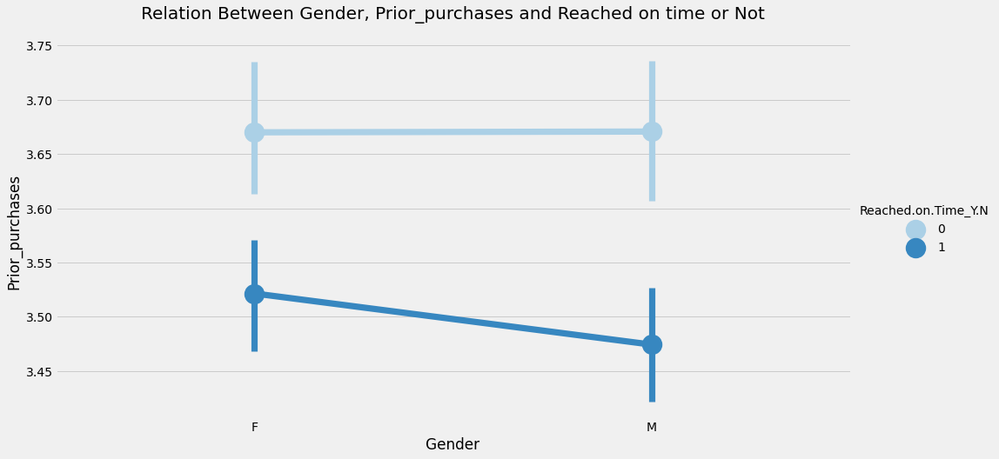

In [21]:
# Relation between Gender, Prior_purchase and whether Reached on Time or not
sns.catplot(x = 'Gender', y = 'Prior_purchases', hue = 'Reached.on.Time_Y.N', data = shipping_data, kind = 'point', height = 7, aspect = 2,
            palette = 'Blues')
plt.title('Relation Between Gender, Prior_purchases and Reached on time or Not\n', fontsize = 20)
plt.show()

### Mode of Shipment

In [22]:
# Catergories with Percentage for Mode of Shipment



mode_of_shipment = object_columns["Mode_of_Shipment"].value_counts().reset_index()
mode_of_shipment.columns = ["Mode_of_Shipment", 'value_counts']
fig = px.pie(mode_of_shipment,names = 'Mode_of_Shipment', values = 'value_counts', width = 500, height = 400, hole = 0.5,color_discrete_sequence=px.colors.sequential.matter_r)
fig.update_traces(textinfo = 'percent+label')

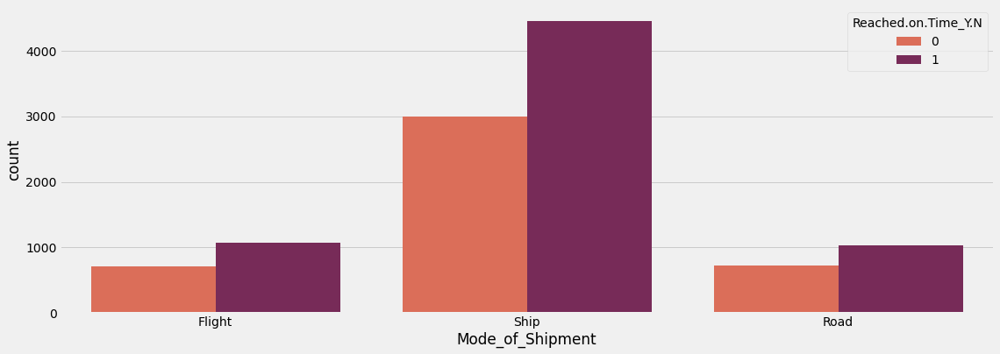

In [23]:
# Impact of Model of shipment with Reached on Time or not

plt.figure(figsize = (17, 6))
sns.countplot("Mode_of_Shipment", hue="Reached.on.Time_Y.N", data = shipping_data,palette = "rocket_r" )
plt.show()

### Product Importance

In [24]:
# Catergories with Percentage for Product Importance

product_importance = object_columns["Product_importance"].value_counts().reset_index()
product_importance.columns = ["Product_importance", 'value_counts']
fig = px.pie(product_importance,names = 'Product_importance', values = 'value_counts', width = 500, height = 400, hole = 0.5,color_discrete_sequence=px.colors.sequential.Inferno_r)
fig.update_traces(textinfo = 'percent+label')

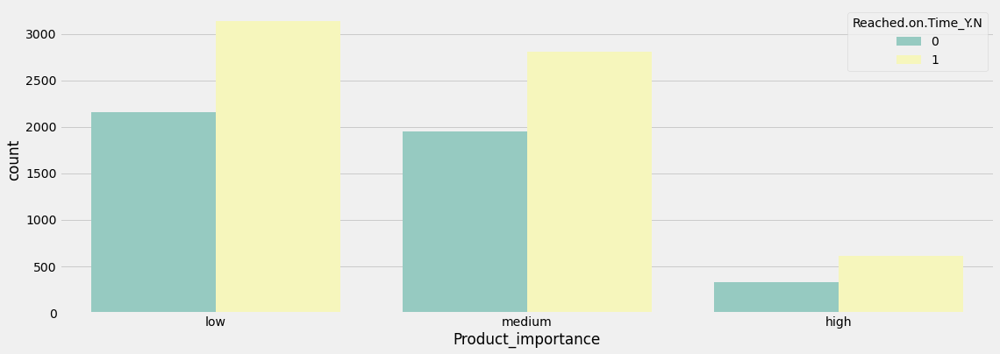

In [25]:
# Impact of Product Importance with Reached on Time or not

plt.figure(figsize = (17, 6))
sns.countplot("Product_importance", hue="Reached.on.Time_Y.N", data = shipping_data,palette = "Set3" )
plt.show()

### Customer_care_calls & Customer_ratings

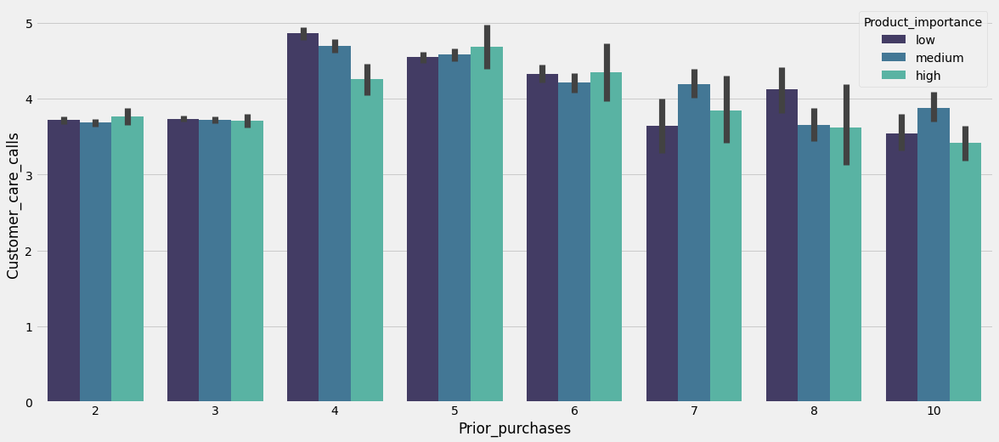

In [26]:
# Relationship between Prior_purchases, customer_Care_calls and product_importance
plt.figure(figsize = (18, 8))
sns.barplot(x = 'Prior_purchases', y = 'Customer_care_calls', data = shipping_data, hue = 'Product_importance',
            palette = 'mako')
plt.show()

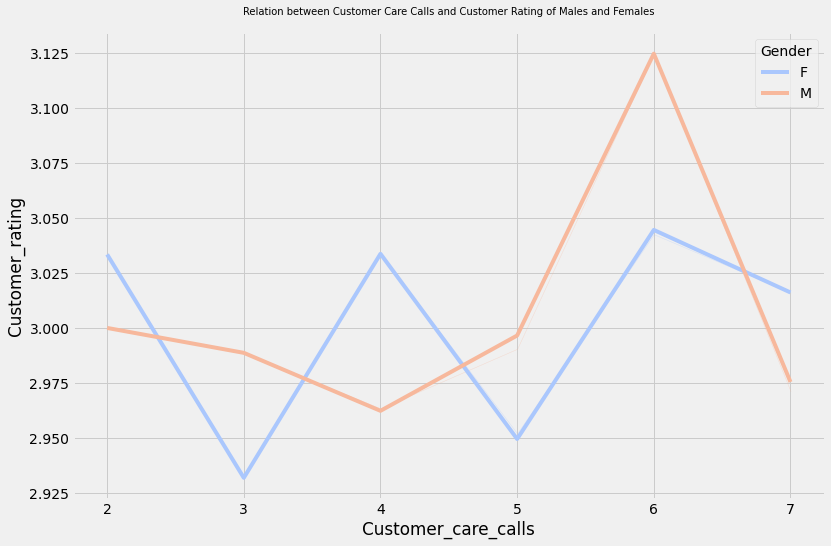

In [27]:
# Relation between Customer Care calls and Customer Ratings by Gender

plt.figure(figsize=(12,8))
sns.lineplot(x = 'Customer_care_calls', y = 'Customer_rating', hue = 'Gender', data = shipping_data,
             palette = 'coolwarm', ci = 0)
plt.title('Relation between Customer Care Calls and Customer Rating of Males and Females\n',
          fontsize = 10)
plt.show()

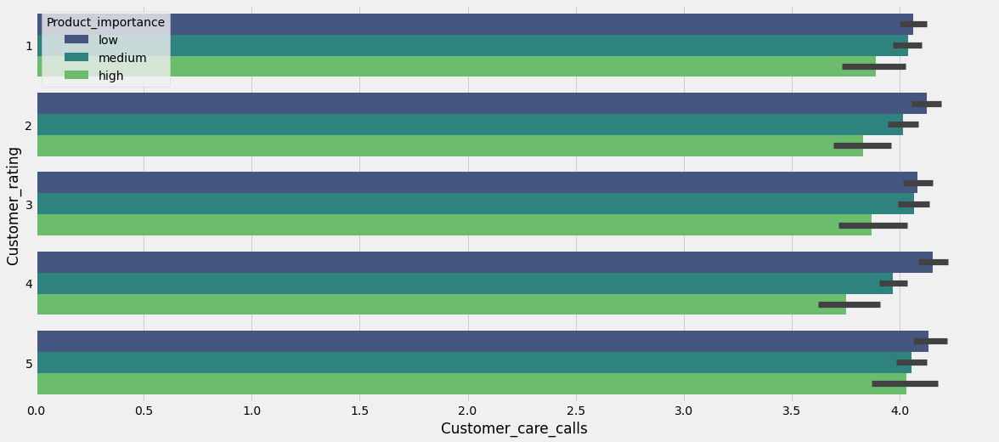

In [28]:
# Relationship between Customer_Care_Calls and customer_rating

plt.figure(figsize = (18, 8))
sns.barplot(x = 'Customer_care_calls', y = 'Customer_rating', data = shipping_data, hue = 'Product_importance',
            palette = 'viridis', orient = 'h')
plt.show()

### Cost of Product

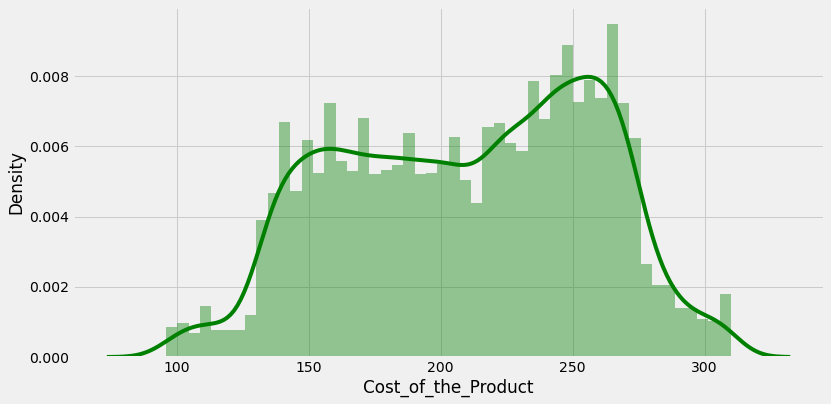

In [29]:
# Distpolt for Cost of Product
plt.figure(figsize = (12,6))
sns.distplot(shipping_data["Cost_of_the_Product"], bins = 50, color = "green")
plt.show()

In [30]:
# Impact of cost of the product with reached on time

fig = px.box(shipping_data, x = "Reached.on.Time_Y.N", y = "Cost_of_the_Product", 
                   hover_data = shipping_data.columns,color_discrete_sequence=px.colors.sequential.Greens_r)
fig.show()

In [31]:
fig = px.histogram(shipping_data, x = "Cost_of_the_Product", color = "Mode_of_Shipment", marginal = "box",
                   hover_data = shipping_data.columns,color_discrete_sequence=px.colors.sequential.Darkmint)
fig.show()

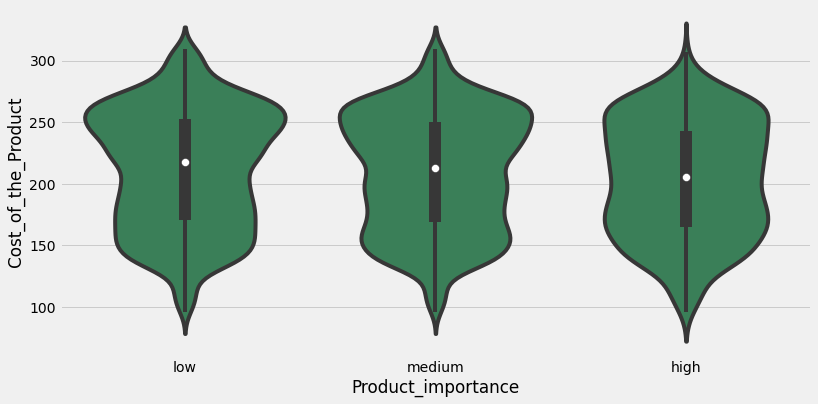

In [32]:
# Relation between product importance and cost of the product
plt.figure(figsize = (12,6))
sns.violinplot(data=shipping_data, x = "Product_importance", y = "Cost_of_the_Product", color = "seagreen")
plt.show()

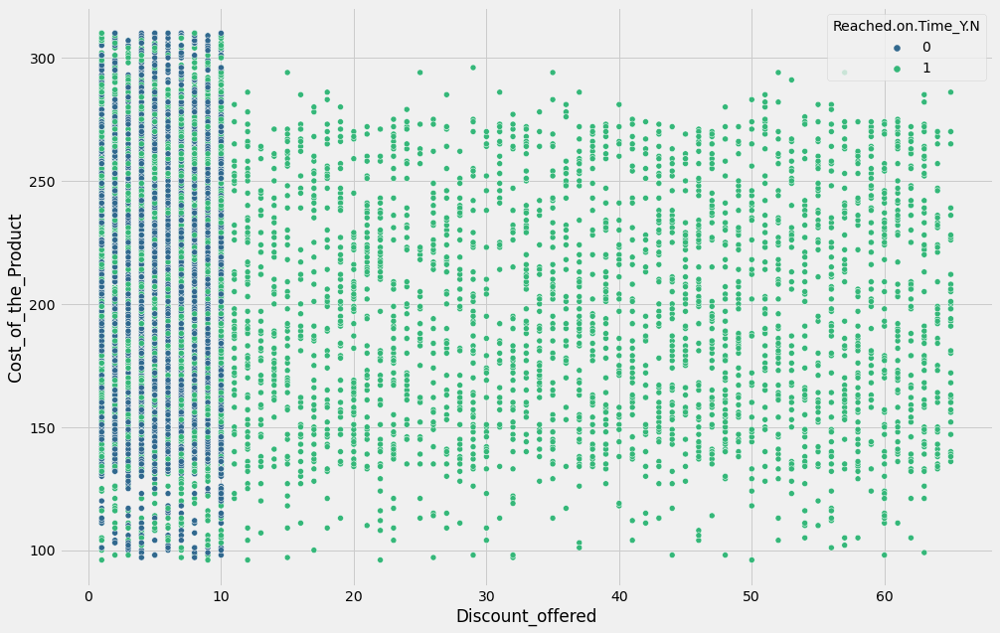

In [33]:
plt.figure(figsize = (15, 10))
sns.scatterplot(x='Discount_offered', y='Cost_of_the_Product', data=shipping_data, hue='Reached.on.Time_Y.N', palette = 'viridis')

plt.show()

### Prior_purchases

In [34]:
px.box(x = 'Prior_purchases', y = 'Cost_of_the_Product', data_frame = shipping_data, color = 'Reached.on.Time_Y.N',
      color_discrete_sequence=px.colors.sequential.Greys_r)

In [35]:
# making boxplot between prior purchases and discount offered and whether or not the product will reach on time or not
# to see that is there any relation between them.

px.box(x = 'Prior_purchases', y = 'Discount_offered', data_frame = shipping_data, color = 'Reached.on.Time_Y.N', 
       color_discrete_sequence=px.colors.sequential.Plasma)

### Product_importance

In [36]:
# making boxplot between product importance and discount offered to see that is there any relation between them .

px.box(data_frame = shipping_data, x = 'Product_importance', y ='Discount_offered', color = 'Product_importance')